In [1]:
import tensorflow as tf
from tensorflow.keras import Model, Input, metrics
from tensorflow.keras import layers #Conv2D, Layer, BatchNormalization, Activation
from tensorflow.keras import optimizers #Adam
from tensorflow.keras import backend
from tensorflow.python.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
%load_ext tensorboard
from tensorboard import notebook
import datetime,os
import numpy as np

from metrics.intersection_over_union import iou
from pooling_layers.max_pooling import MaxPoolingWithArgmax2D
from pooling_layers.max_unpooling import MaxUnpooling2D
from data_processing import prepare_data

In [2]:
def SegNet(input_shape, batch_size, n_labels=2, kernel=3, pool_size=(2, 2), output_mode="softmax", model_summary=None):
    # encoder
    inputs = Input(shape=input_shape, batch_size=batch_size)

    conv_1 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(inputs)
    conv_1 = layers.BatchNormalization()(conv_1)
    conv_1 = layers.Activation("relu")(conv_1)
    conv_2 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_1)
    conv_2 = layers.BatchNormalization()(conv_2)
    conv_2 = layers.Activation("relu")(conv_2)

    pool_1, mask_1 = MaxPoolingWithArgmax2D(pool_size)(conv_2)

    conv_3 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_1)
    conv_3 = layers.BatchNormalization()(conv_3)
    conv_3 = layers.Activation("relu")(conv_3)
    conv_4 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_3)
    conv_4 = layers.BatchNormalization()(conv_4)
    conv_4 = layers.Activation("relu")(conv_4)

    pool_2, mask_2 = MaxPoolingWithArgmax2D(pool_size)(conv_4)

    conv_5 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_2)
    conv_5 = layers.BatchNormalization()(conv_5)
    conv_5 = layers.Activation("relu")(conv_5)
    conv_6 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_5)
    conv_6 = layers.BatchNormalization()(conv_6)
    conv_6 = layers.Activation("relu")(conv_6)
    conv_7 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_6)
    conv_7 = layers.BatchNormalization()(conv_7)
    conv_7 = layers.Activation("relu")(conv_7)

    pool_3, mask_3 = MaxPoolingWithArgmax2D(pool_size)(conv_7)
    
    conv_8 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(pool_3)
    conv_8 = layers.BatchNormalization()(conv_8)
    conv_8 = layers.Activation("relu")(conv_8)
    conv_9 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_8)
    conv_9 = layers.BatchNormalization()(conv_9)
    conv_9 = layers.Activation("relu")(conv_9)
    conv_10 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_9)
    conv_10 = layers.BatchNormalization()(conv_10)
    conv_10 = layers.Activation("relu")(conv_10)
    conv_11 = layers.Conv2D(256, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_10)
    conv_11 = layers.BatchNormalization()(conv_11)
    conv_11 = layers.Activation("relu")(conv_11)

    pool_4, mask_4 = MaxPoolingWithArgmax2D(pool_size)(conv_11)
    print("Build enceder done..")
    

    # decoder
    unpool_1 = MaxUnpooling2D(pool_size)([pool_4, mask_4])

    conv_12 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_1)
    conv_12 = layers.BatchNormalization()(conv_12)
    conv_12 = layers.Activation("relu")(conv_12)
    conv_13 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_12)
    conv_13 = layers.BatchNormalization()(conv_13)
    conv_13 = layers.Activation("relu")(conv_13)
    conv_14 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_13)
    conv_14 = layers.BatchNormalization()(conv_14)
    conv_14 = layers.Activation("relu")(conv_14)
    conv_15 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_14)
    conv_15 = layers.BatchNormalization()(conv_15)
    conv_15 = layers.Activation("relu")(conv_15)
    
    unpool_2 = MaxUnpooling2D(pool_size)([conv_15, mask_3])

    conv_16 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_2)
    conv_16 = layers.BatchNormalization()(conv_16)
    conv_16 = layers.Activation("relu")(conv_16)
    conv_17 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_16)
    conv_17 = layers.BatchNormalization()(conv_17)
    conv_17 = layers.Activation("relu")(conv_17)
    conv_18 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_17)
    conv_18 = layers.BatchNormalization()(conv_18)
    conv_18 = layers.Activation("relu")(conv_18)

    unpool_3 = MaxUnpooling2D(pool_size)([conv_18, mask_2])

    conv_19 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_3)
    conv_19 = layers.BatchNormalization()(conv_19)
    conv_19 = layers.Activation("relu")(conv_19)
    conv_20 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_19)
    conv_20 = layers.BatchNormalization()(conv_20)
    conv_20 = layers.Activation("relu")(conv_20)

    unpool_4 = MaxUnpooling2D(pool_size)([conv_20, mask_1])

    conv_21 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(unpool_4)
    conv_21 = layers.BatchNormalization()(conv_21)
    conv_21 = layers.Activation("relu")(conv_21)
    conv_22 = layers.Conv2D(128, (kernel, kernel), padding="same", kernel_initializer = 'he_normal')(conv_21)
    conv_22 = layers.BatchNormalization()(conv_22)
    conv_22 = layers.Activation("relu")(conv_22)

    out=layers.Conv2D(n_labels,1, activation = output_mode)(conv_22)
    print("Build decoder done..")

    model = Model(inputs=inputs, outputs=out, name="SegNet")
    model.compile(optimizer = optimizers.Adam(lr = 1e-3), loss = 'categorical_crossentropy',metrics=[iou,'accuracy'])

    if model_summary is True:
        model.summary()

    return model

In [ ]:
tb = TensorBoard(log_dir='training_logs/test_log1', write_graph=True)
mc = ModelCheckpoint(mode='max', filepath='trained_models/test1.h5', monitor='iou', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='min', monitor='val_loss', patience=50, verbose=1)
callbacks = [tb, mc, es]
model=SegNet(input_shape=(256, 256, 3), batch_size=16, n_labels=2, model_summary=True)
batch_size = 16
num_epochs = 25
model.fit(prepare_data.train_data_generator(batch_size=16),
                    validation_data=prepare_data.validation_data_generator(batch_size=16),epochs=num_epochs, 
                    verbose=1,steps_per_epoch=246, validation_steps=84,callbacks=callbacks)


In [ ]:
model=SegNet(input_shape=(256, 256, 3), batch_size=16, n_labels=2, model_summary=True)
model.load_weights('trained_models/segnet_2.h5')
result=model.evaluate(prepare_data.test_data_generator(batch_size=16),steps=85)
print(result)

Build enceder done..
Build decoder done..
Model: "SegNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(16, 256, 256, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (16, 256, 256, 128)  3584        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_22 (BatchNo (16, 256, 256, 128)  512         conv2d_23[0][0]                  
__________________________________________________________________________________________________
activation_22 (Activation)      (16, 256, 256, 128)  0           batch_normalization_22[0][0]     
___________________________________________________

Found 1360 images belonging to 2 classes.
Found 1360 images belonging to 2 classes.


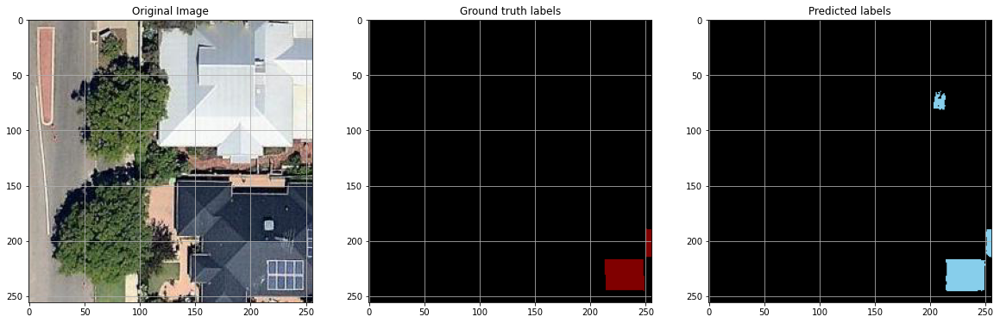

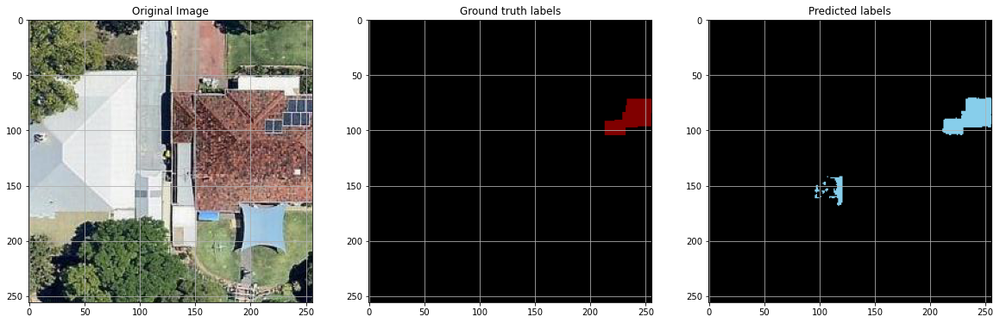

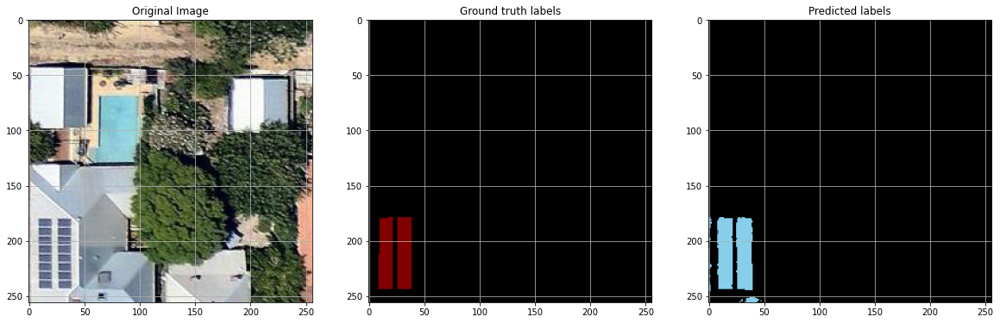

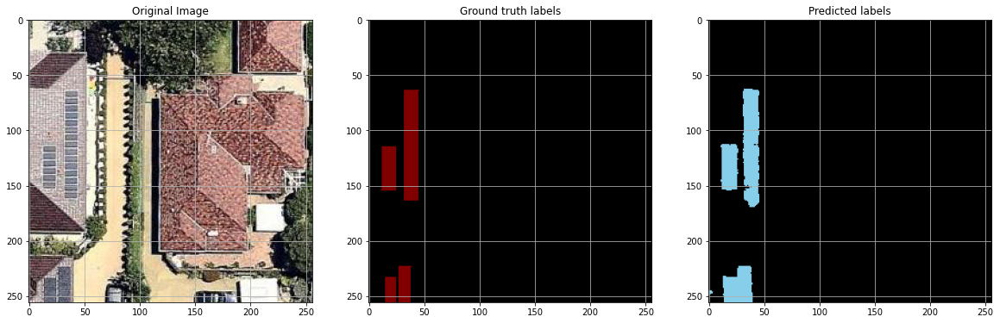

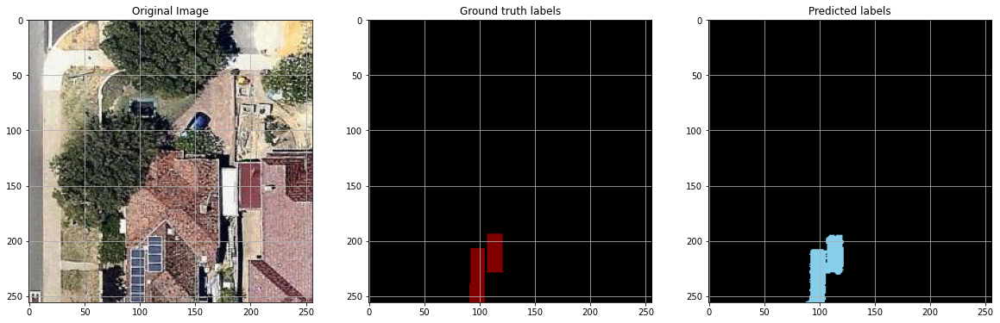

...

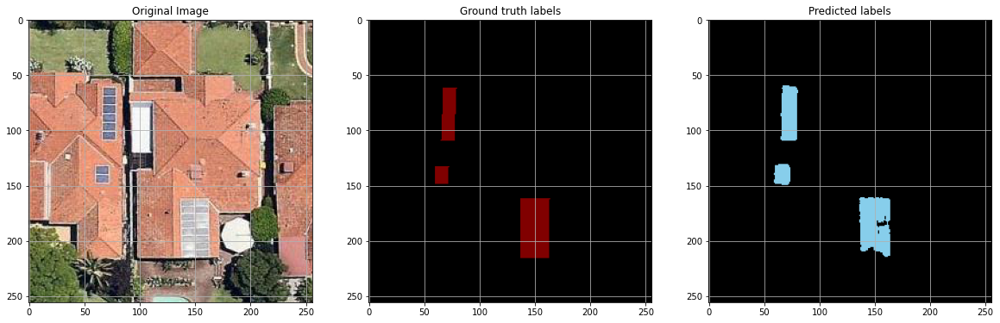

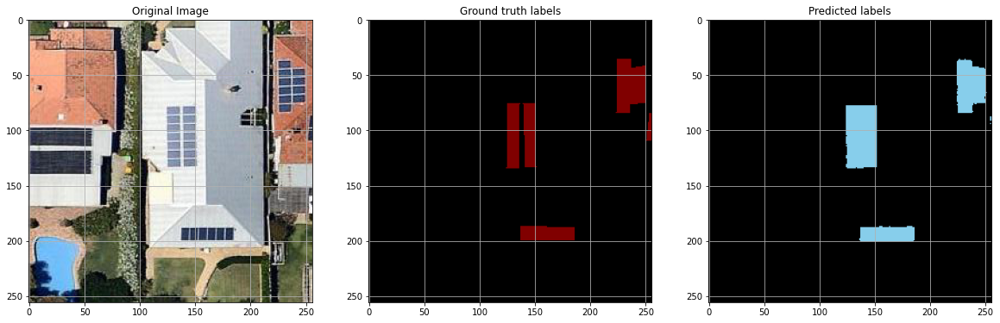

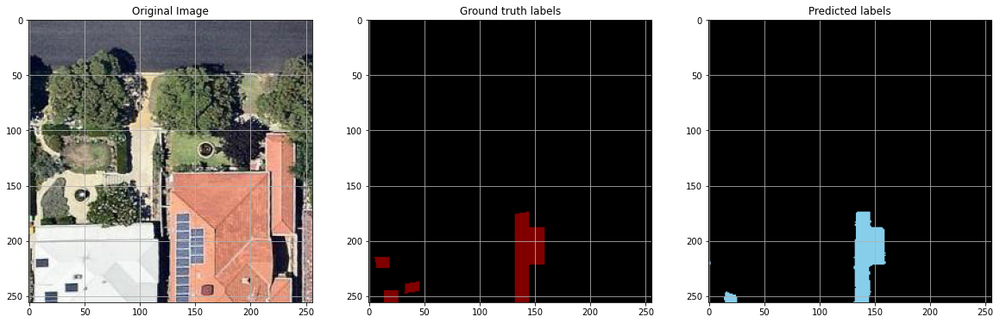

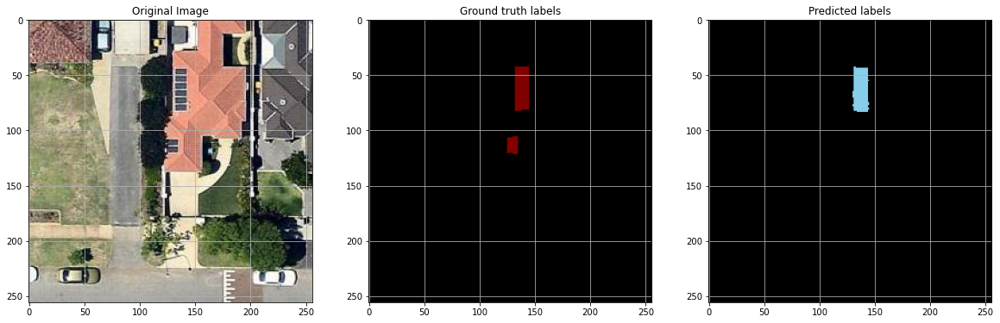

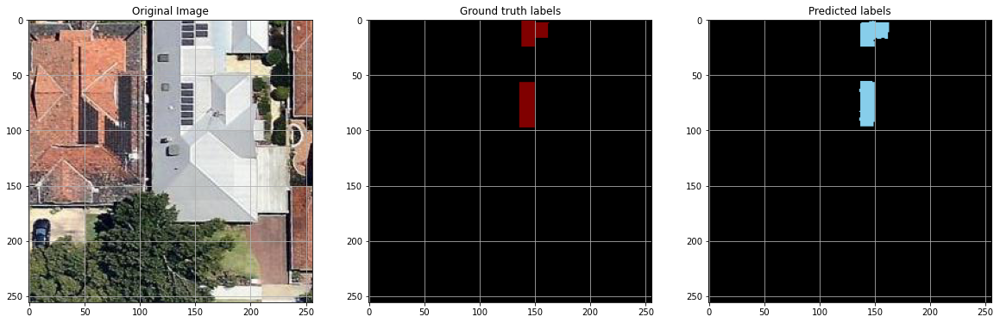

In [5]:
model=SegNet(input_shape=(256, 256, 3), batch_size=16, n_labels=2, model_summary=True)
model.load_weights('trained_models/segnet_2.h5')
flag=2
testing_gen = prepare_data.test_data_generator(batch_size=16, seed=13)
#testing_gen=PrepareData.images_without_label_data_generator(batch_size=16)
while(flag>0):
    flag=flag-1
    batch_img, batch_mask= next(testing_gen)
    #batch_img = next(testing_gen)
    pred_all = model.predict(batch_img)
    np.shape(pred_all)

    for i in range(0, np.shape(pred_all)[0]):
        fig = plt.figure(figsize=(20, 8))

        ax1 = fig.add_subplot(1, 3, 1)
        ax1.imshow(batch_img[i])
        ax1.title.set_text('Original Image')
        ax1.grid(b=None)

        ax2 = fig.add_subplot(1, 3, 2)
        ax2.set_title('Ground truth labels')
        ax2.imshow(prepare_data.onehot_to_rgb(batch_mask[i], prepare_data.id2code))
        ax2.grid(b=None)

        ax3 = fig.add_subplot(1, 3, 3)
        ax3.set_title('Predicted labels')
        #Use a different color for prediction
        new_color_code={0: (0, 0, 0), 1: (135,206,235)}
        ax3.imshow(prepare_data.onehot_to_rgb(pred_all[i], new_color_code))
        ax3.grid(b=None)
        plt.show()

In [ ]:
%tensorboard --logdir logs15
#!tensorboard --logdir /tmp/whatever